# Rainfall Weather Forecasting

# Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 


# 1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

To Predict:

1.Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

2.Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.



Dataset Description: Number of columns: 23

1.Date - The date of observation

2.Location -The common name of the location of the weather station

3.MinTemp -The minimum temperature in degrees celsius

4.MaxTemp -The maximum temperature in degrees celsius

5.Rainfall -The amount of rainfall recorded for the day in mm

6.Evaporation -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

7.Sunshine -The number of hours of bright sunshine in the day.

8.WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

9.WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

10.WindDir9am -Direction of the wind at 9am

11.WindDir3pm -Direction of the wind at 3pm

12.WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

13.WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

14.Humidity9am -Humidity (percent) at 9am

15.Humidity3pm -Humidity (percent) at 3pm

16.Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

17.Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

18.Cloud9am - Fraction of sky obscured by cloud at 9am.

19.Cloud3pm -Fraction of sky obscured by cloud

20.Temp9am-Temperature (degrees C) at 9am

21.Temp3pm -Temperature (degrees C) at 3pm

22.RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

23.RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
from scipy.stats import zscore

from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

# Loading Dataset

In [2]:
df = pd.read_csv('Rainfall_forecast.csv')


In [3]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [6]:
df.shape

(8425, 23)

In [7]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [8]:
# Checking for the missing values in the dataset

df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [9]:
# Checking for the information of the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [10]:
# Checking for numerical and categorical features.

nf = df.select_dtypes(include=[np.number]).columns
cf = df.select_dtypes(include=[np.object]).columns

print('Numerical features in the dataset are:\n',nf,'\n','-'*70,'\n Categorical features in the dataset are:\n',cf)

Numerical features in the dataset are:
 Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object') 
 ---------------------------------------------------------------------- 
 Categorical features in the dataset are:
 Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


# Handling Missing Value With Imputer

In [11]:
from sklearn.impute import SimpleImputer
# Handling Missing Values for Numerical Columns
numerical_cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

numerical_imputer = SimpleImputer(strategy='mean')
df[numerical_cols] = numerical_imputer.fit_transform(df[numerical_cols])

In [12]:
# Handling Missing Values for Categorical Columns
categorical_cols = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

categorical_imputer = SimpleImputer(strategy='most_frequent')
df[categorical_cols] = categorical_imputer.fit_transform(df[categorical_cols])

In [13]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

# datetime format

In [14]:
# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])
df["Day"] = df['Date'].dt.day
df["Month"] = df['Date'].dt.month
df["Year"] = df['Date'].dt.year


# Drop the original 'Date' 
df.drop('Date', axis=1, inplace=True)





1.Location

In [15]:
# Count of RainToday for each location
rain_today_counts = df.groupby(['Location', 'RainToday']).size().unstack(fill_value=0)
rain_today_counts

RainToday,No,Yes
Location,,
Adelaide,161,44
Albury,708,199
Brisbane,444,135
CoffsHarbour,424,187
Darwin,217,33
Melbourne,1218,404
Newcastle,624,198
Penrith,366,116
PerthAirport,962,242


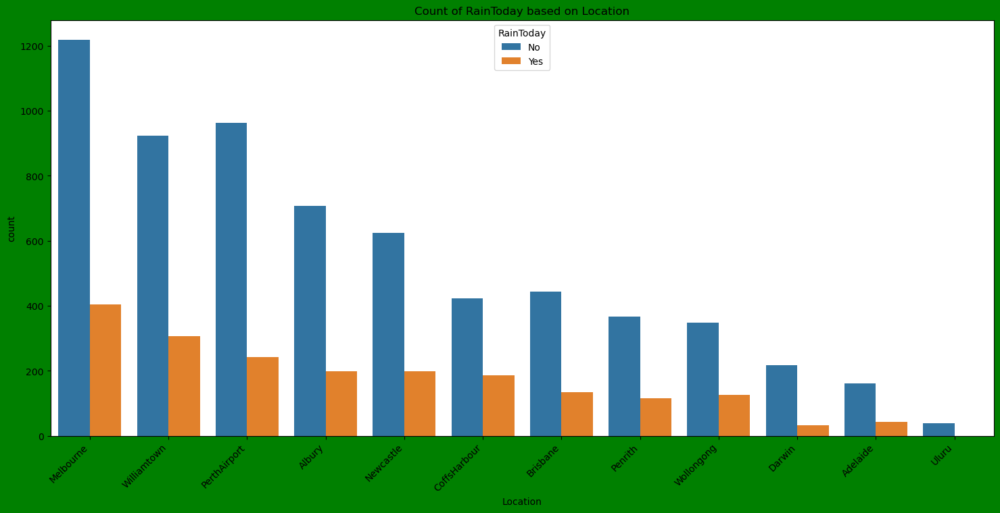

In [16]:
plt.figure(figsize=(18, 8), facecolor='g')
sns.countplot(x='Location', hue='RainToday', data=df, order=df['Location'].value_counts().index)
plt.xlabel('Location')
plt.title('Count of RainToday based on Location')
plt.xticks(rotation=45, ha='right')
plt.legend(title='RainToday')
plt.show()

melbourne show maximum and uluru show nothing and Darwin show minimun.

In [17]:
# Count of RainTomorrow for each location
rain_tomorrow_counts = df.groupby(['Location', 'RainTomorrow']).size().unstack(fill_value=0)
rain_tomorrow_counts

RainTomorrow,No,Yes
Location,,
Adelaide,160,45
Albury,708,199
Brisbane,444,135
CoffsHarbour,425,186
Darwin,218,32
Melbourne,1216,406
Newcastle,624,198
Penrith,366,116
PerthAirport,962,242


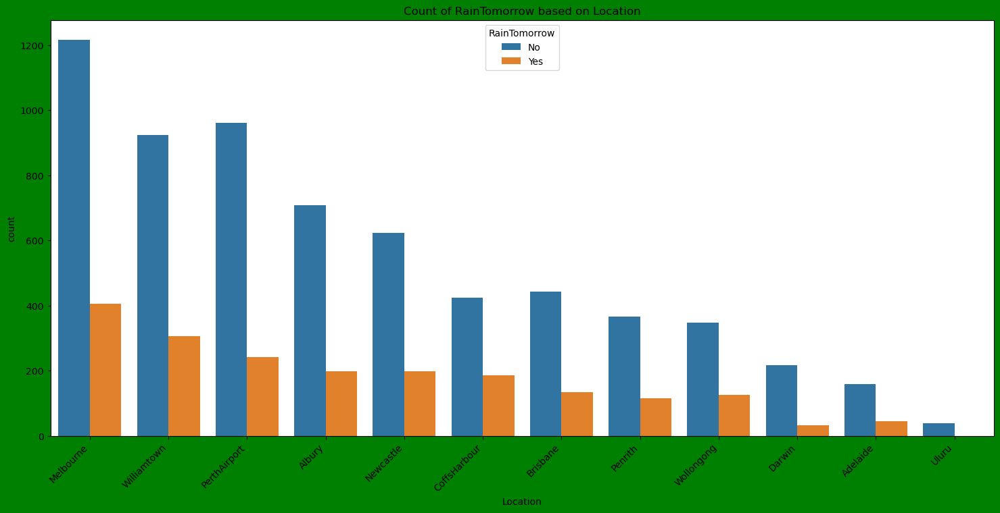

In [18]:
plt.figure(figsize=(18, 8), facecolor='g')
sns.countplot(x='Location', hue='RainTomorrow', data=df, order=df['Location'].value_counts().index)
plt.xlabel('Location')
plt.title('Count of RainTomorrow based on Location')
plt.xticks(rotation=45, ha='right')
plt.legend(title='RainTomorrow')
plt.show()

High Counts for 'Yes': Melbourne, Williamtown, Brisbane, PerthAirport.
    
Low Counts for 'Yes': Uluru.

N      1704
SSE     578
S       577
SW      572
E       557
WNW     531
W       507
WSW     504
SE      484
ENE     415
SSW     396
NW      383
NE      353
NNE     343
ESE     302
NNW     219
Name: WindGustDir, dtype: int64


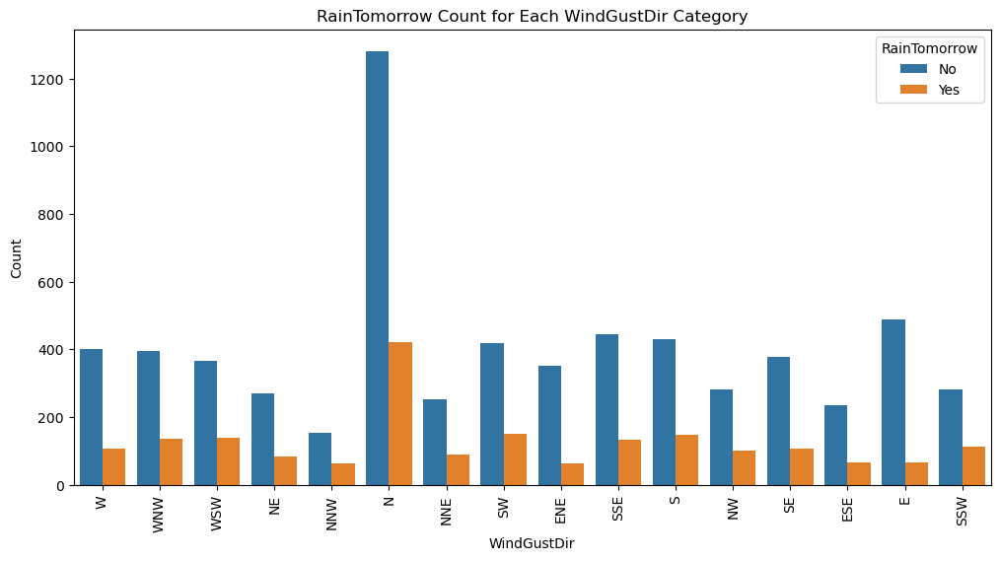

In [19]:
# Print value counts for each WindGustDir category
print(df['WindGustDir'].value_counts())

# Plot count of RainTomorrow for each WindGustDir category
plt.figure(figsize=(12, 6))
sns.countplot(x='WindGustDir', hue='RainTomorrow', data=df)
plt.title('RainTomorrow Count for Each WindGustDir Category')
plt.xlabel('WindGustDir')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='RainTomorrow', loc='upper right')
plt.show()

N      1735
SW      704
NW      625
WSW     543
SE      505
WNW     480
SSW     467
ENE     433
NNE     430
W       414
NE      409
S       402
E       380
SSE     365
NNW     280
ESE     253
Name: WindDir9am, dtype: int64


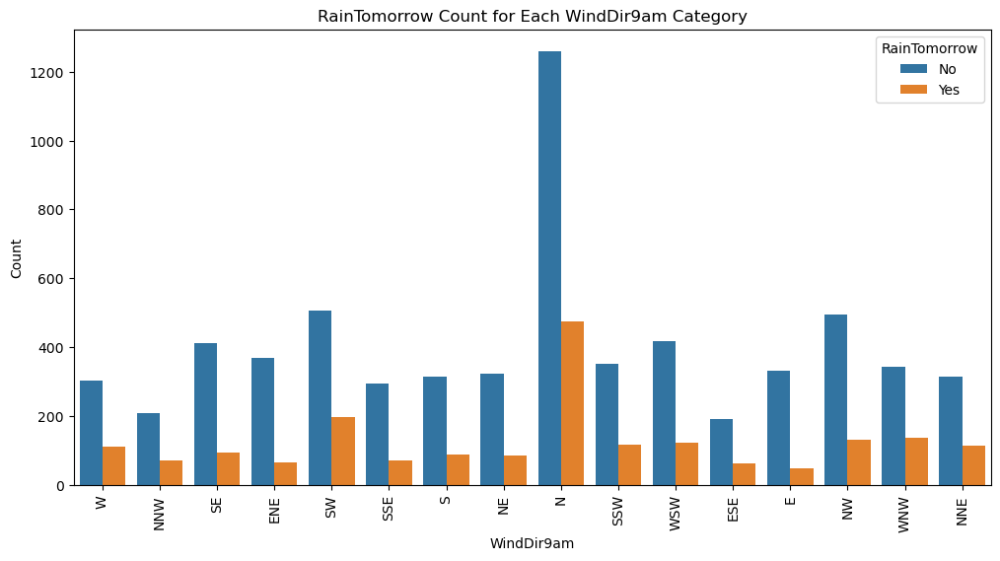

In [20]:
# Print value counts for each WindDir9am category
print(df['WindDir9am'].value_counts())

# Plot count of RainTomorrow for each WindDir9am category
plt.figure(figsize=(12, 6))
sns.countplot(x='WindDir9am', hue='RainTomorrow', data=df)
plt.title('RainTomorrow Count for Each WindDir9am Category')
plt.xlabel('WindDir9am')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='RainTomorrow', loc='upper right')
plt.show()

SE     1121
S       742
SSE     623
WSW     580
NE      544
N       524
SW      494
WNW     487
NW      468
W       462
ESE     462
E       460
ENE     417
SSW     370
NNE     365
NNW     306
Name: WindDir3pm, dtype: int64


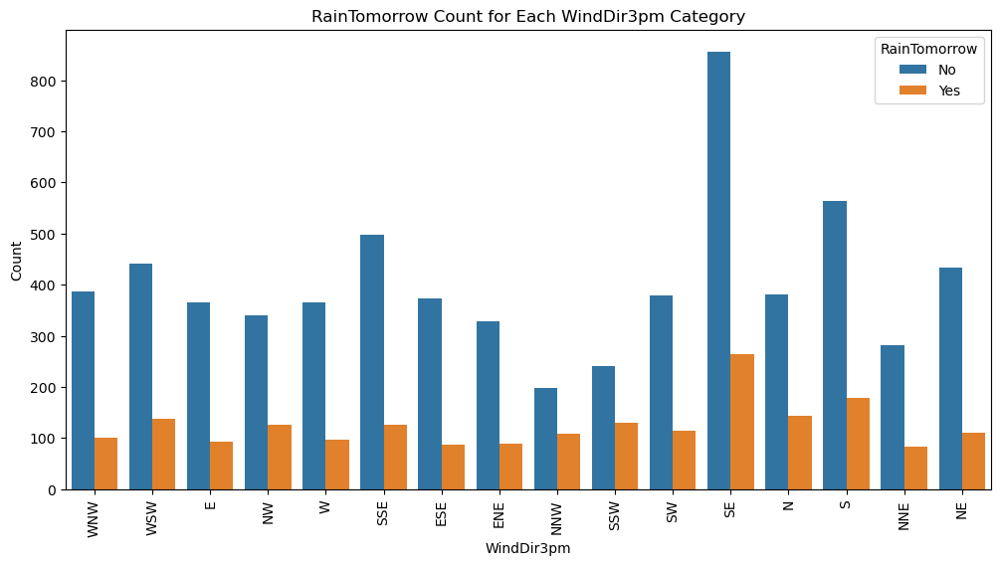

In [21]:
# Print value counts for each WindDir3pm category
print(df['WindDir3pm'].value_counts())

# Plot count of RainTomorrow for each WindDir3pm category
plt.figure(figsize=(12, 6))
sns.countplot(x='WindDir3pm', hue='RainTomorrow', data=df)
plt.title('RainTomorrow Count for Each WindDir3pm Category')
plt.xlabel('WindDir3pm')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='RainTomorrow', loc='upper right')
plt.show()

No     6435
Yes    1990
Name: RainToday, dtype: int64


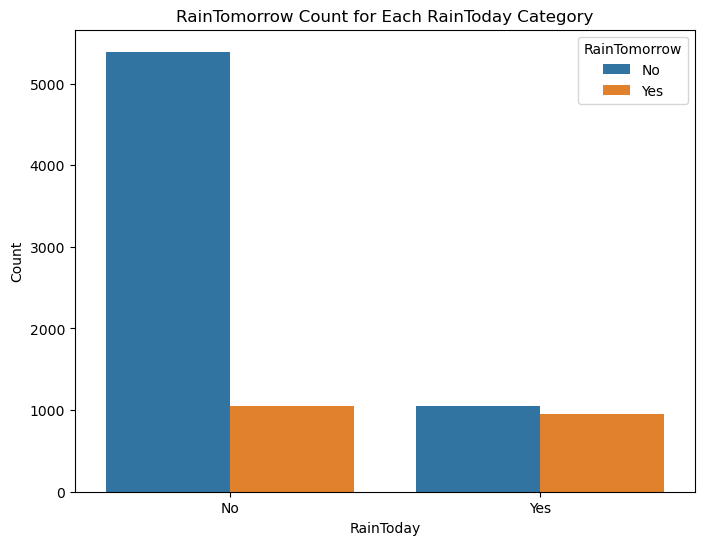

In [22]:
# Print value counts for each RainToday category
print(df['RainToday'].value_counts())

# Plot count of RainTomorrow for each RainToday category
plt.figure(figsize=(8, 6))
sns.countplot(x='RainToday', hue='RainTomorrow', data=df)
plt.title('RainTomorrow Count for Each RainToday Category')
plt.xlabel('RainToday')
plt.ylabel('Count')
plt.legend(title='RainTomorrow', loc='upper right')
plt.show()

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64


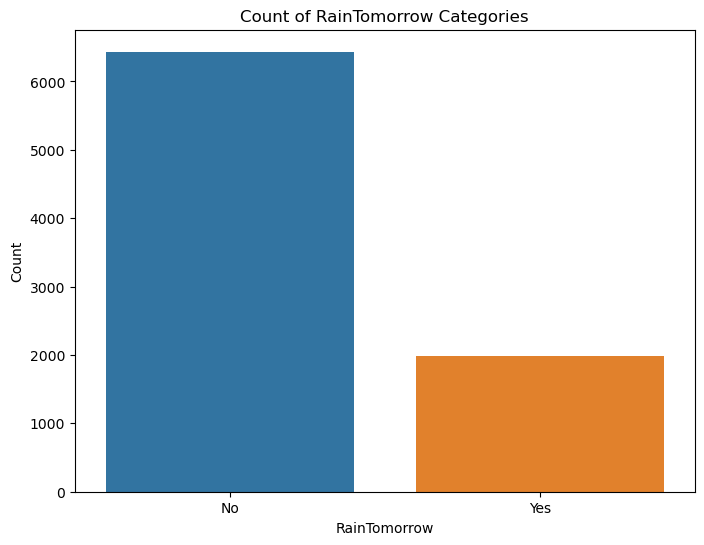

In [23]:
# Print value counts for each RainTomorrow category
print(df['RainTomorrow'].value_counts())

# Plot count of RainTomorrow
plt.figure(figsize=(8, 6))
sns.countplot(x='RainTomorrow', data=df)
plt.title('Count of RainTomorrow Categories')
plt.xlabel('RainTomorrow')
plt.ylabel('Count')
plt.show()

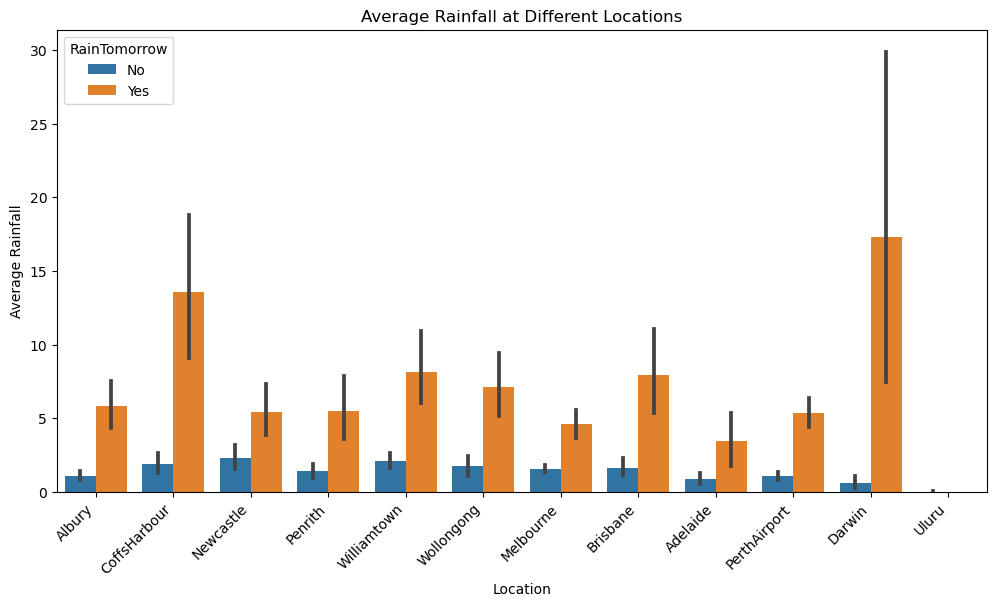

In [24]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Location', y='Rainfall', hue='RainTomorrow',data=df)
plt.title('Average Rainfall at Different Locations')
plt.xlabel('Location')
plt.ylabel('Average Rainfall')
plt.xticks(rotation=45, ha='right')
plt.show()

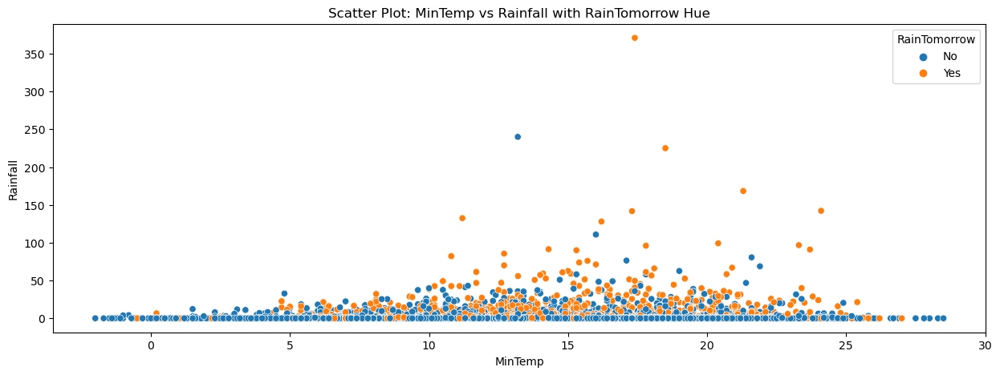

In [25]:
plt.figure(figsize=(15, 5))
sns.scatterplot(x='MinTemp', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: MinTemp vs Rainfall with RainTomorrow Hue')
plt.xlabel('MinTemp')
plt.ylabel('Rainfall')
plt.show()

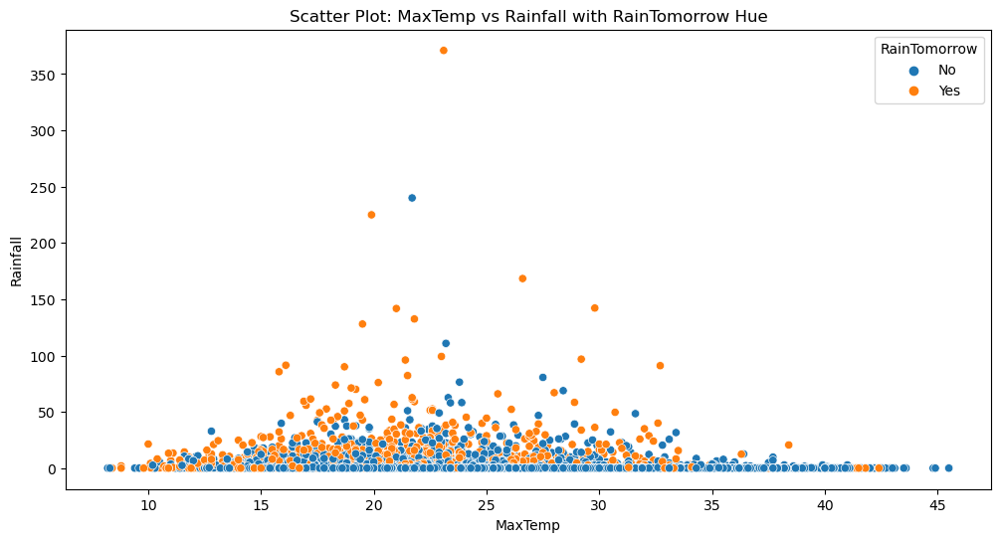

In [26]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='MaxTemp', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: MaxTemp vs Rainfall with RainTomorrow Hue')
plt.xlabel('MaxTemp')
plt.ylabel('Rainfall')
plt.show()

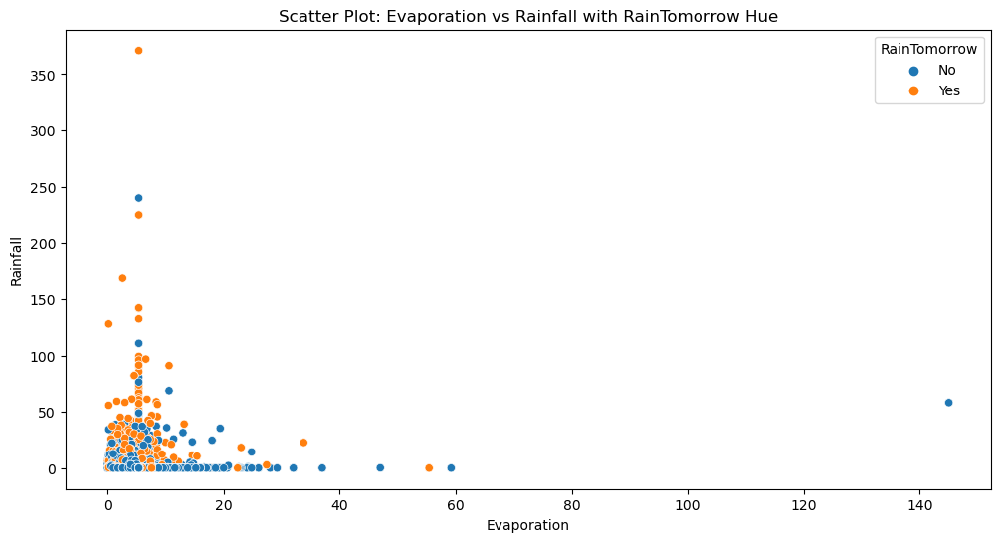

In [27]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Evaporation', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Evaporation vs Rainfall with RainTomorrow Hue')
plt.xlabel('Evaporation')
plt.ylabel('Rainfall')
plt.show()

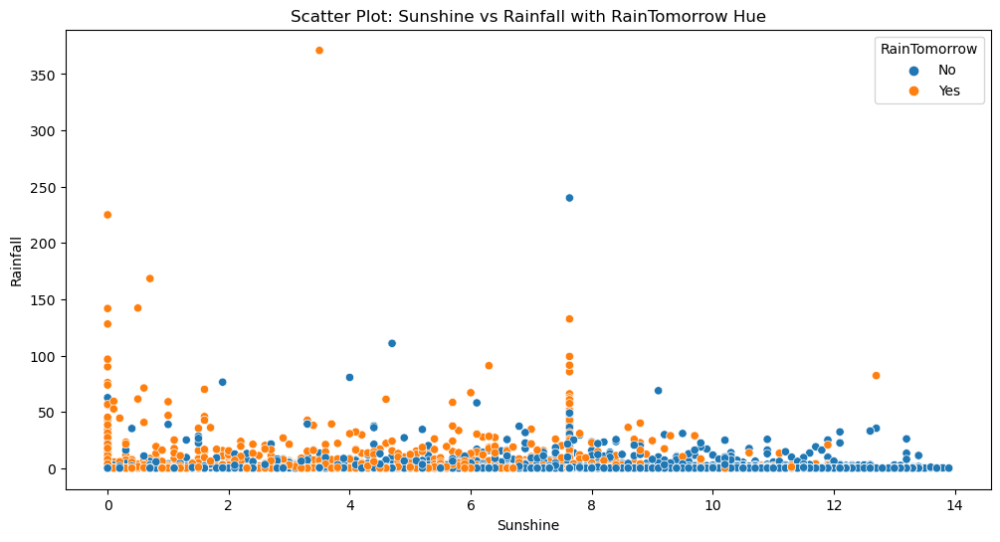

In [28]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Sunshine', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Sunshine vs Rainfall with RainTomorrow Hue')
plt.xlabel('Sunshine')
plt.ylabel('Rainfall')
plt.show()

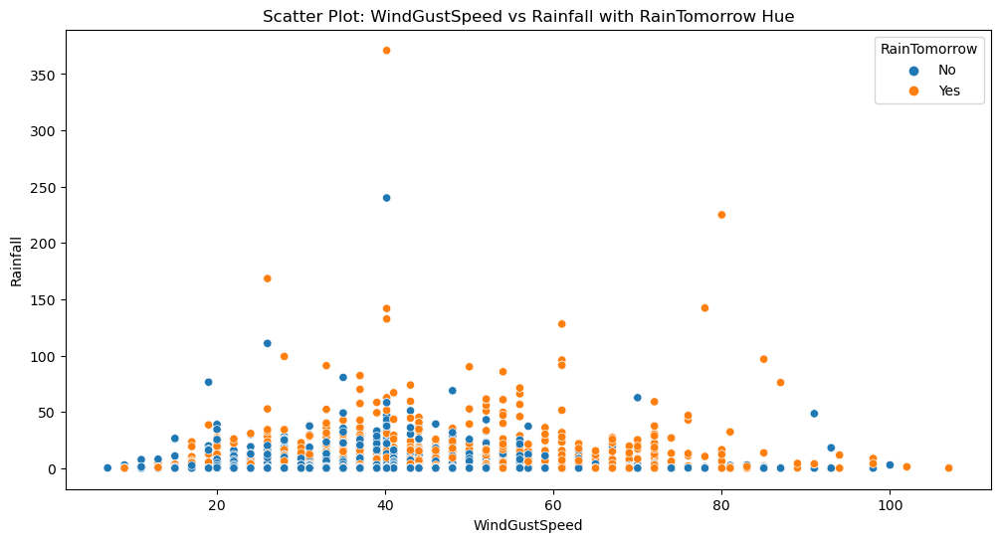

In [29]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='WindGustSpeed', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: WindGustSpeed vs Rainfall with RainTomorrow Hue')
plt.xlabel('WindGustSpeed')
plt.ylabel('Rainfall')
plt.show()

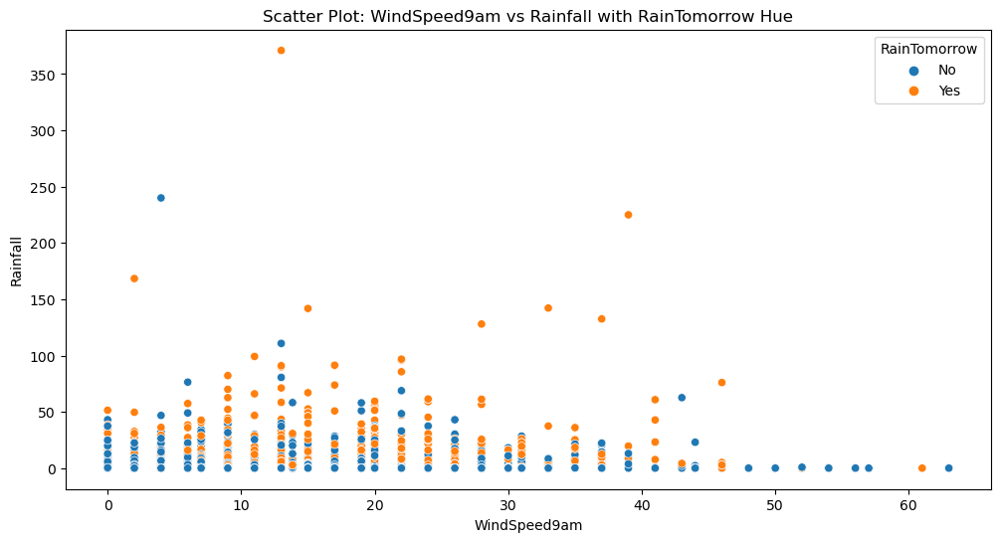

In [30]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='WindSpeed9am', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: WindSpeed9am vs Rainfall with RainTomorrow Hue')
plt.xlabel('WindSpeed9am')
plt.ylabel('Rainfall')
plt.show()

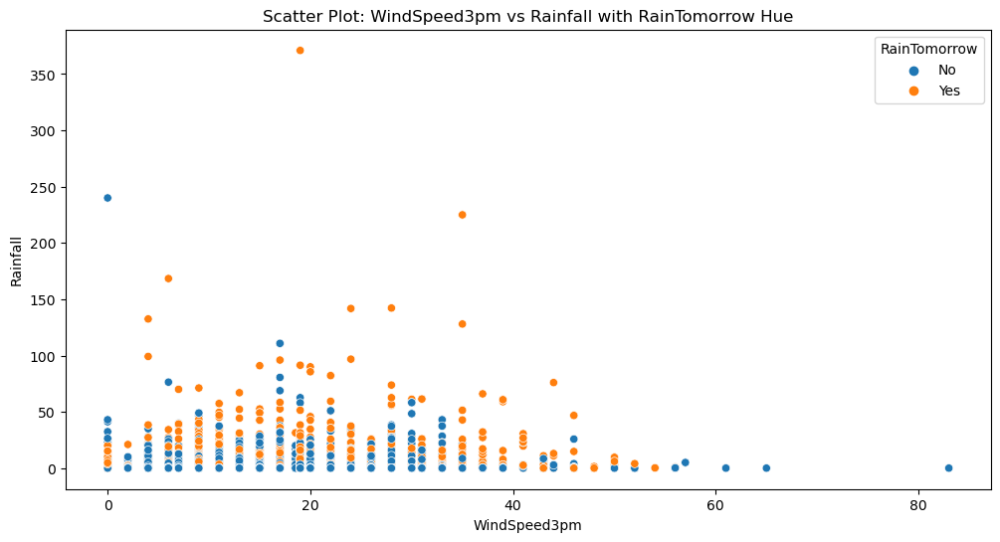

In [31]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='WindSpeed3pm', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: WindSpeed3pm vs Rainfall with RainTomorrow Hue')
plt.xlabel('WindSpeed3pm')
plt.ylabel('Rainfall')
plt.show()

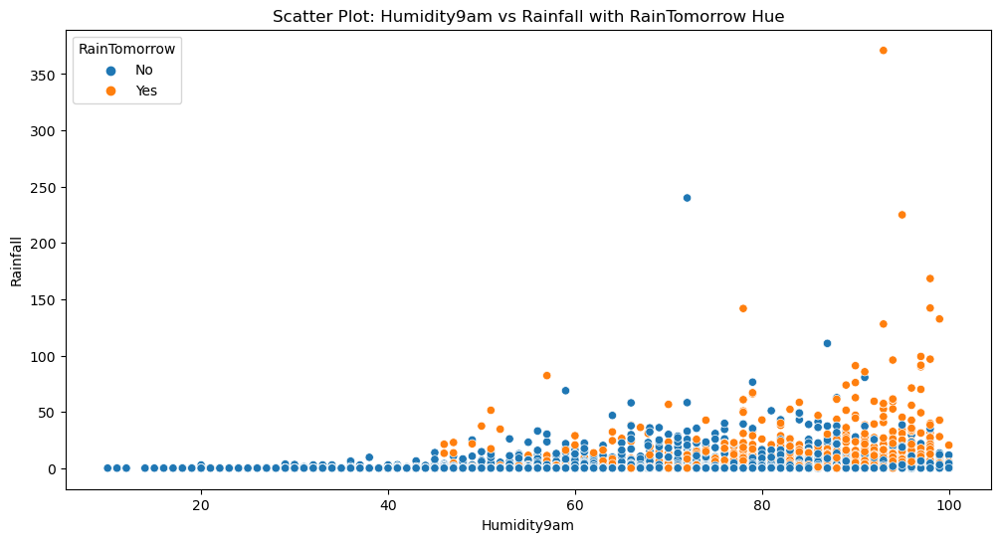

In [32]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Humidity9am', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Humidity9am vs Rainfall with RainTomorrow Hue')
plt.xlabel('Humidity9am')
plt.ylabel('Rainfall')
plt.show()

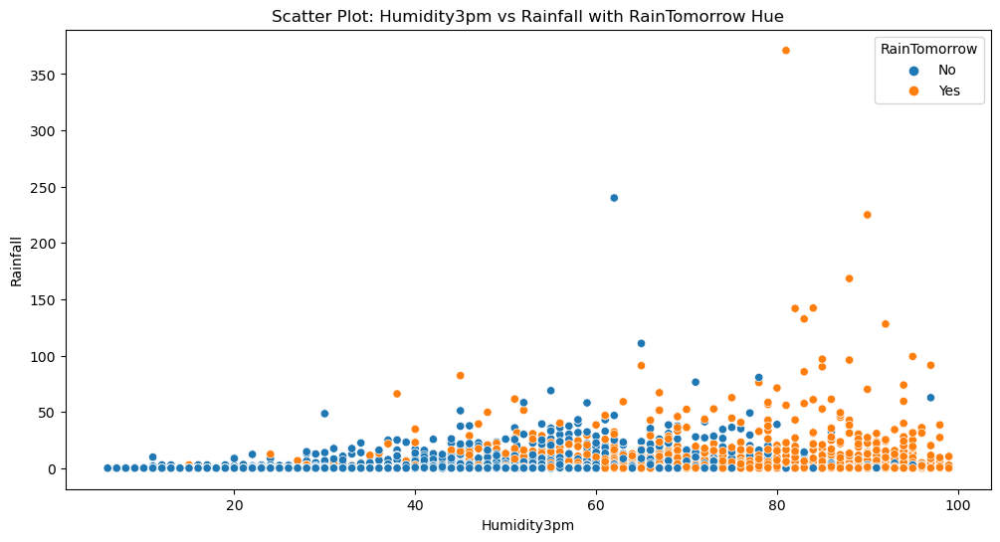

In [33]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Humidity3pm', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Humidity3pm vs Rainfall with RainTomorrow Hue')
plt.xlabel('Humidity3pm')
plt.ylabel('Rainfall')
plt.show()

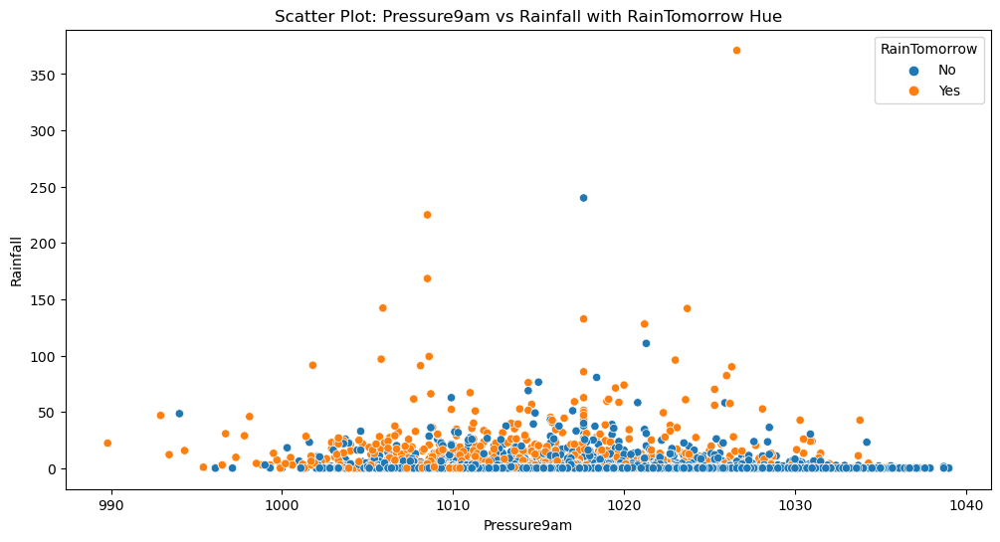

In [34]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Pressure9am', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Pressure9am vs Rainfall with RainTomorrow Hue')
plt.xlabel('Pressure9am')
plt.ylabel('Rainfall')
plt.show()

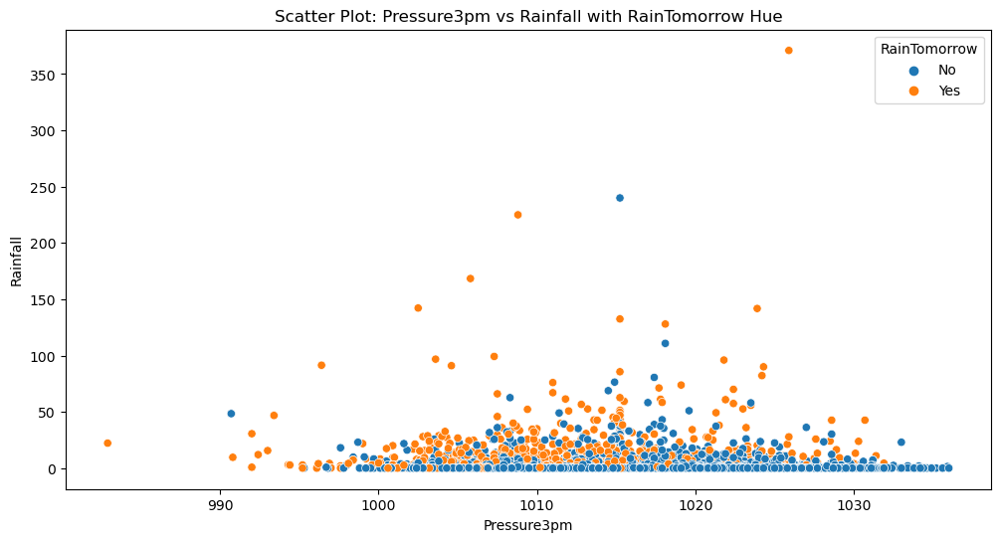

In [35]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Pressure3pm', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Pressure3pm vs Rainfall with RainTomorrow Hue')
plt.xlabel('Pressure3pm')
plt.ylabel('Rainfall')
plt.show()

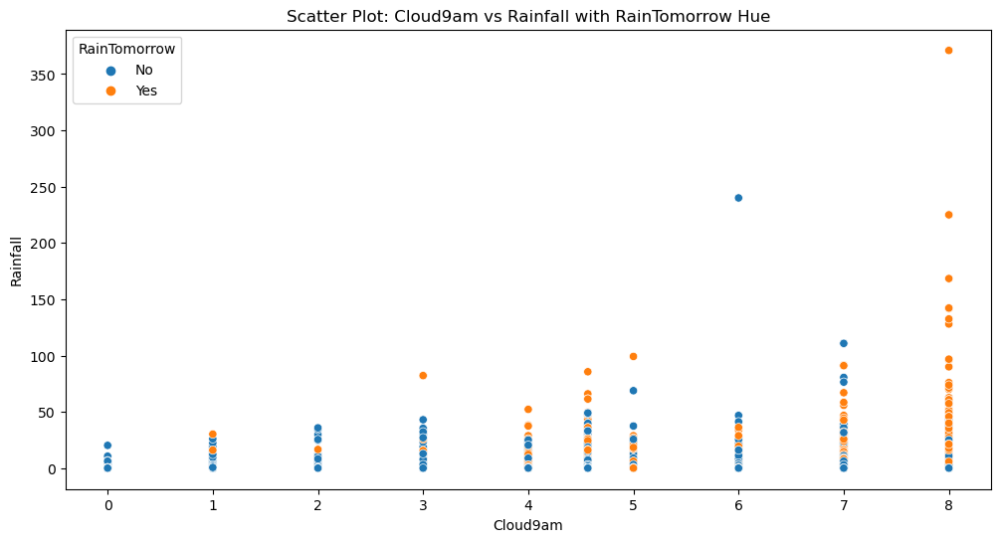

In [36]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Cloud9am', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Cloud9am vs Rainfall with RainTomorrow Hue')
plt.xlabel('Cloud9am')
plt.ylabel('Rainfall')
plt.show()

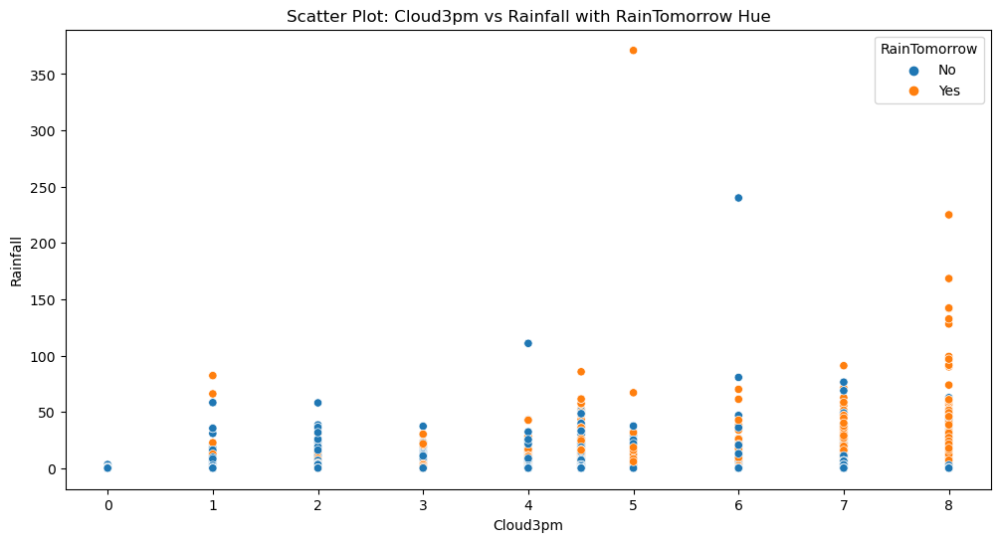

In [37]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Cloud3pm', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Cloud3pm vs Rainfall with RainTomorrow Hue')
plt.xlabel('Cloud3pm')
plt.ylabel('Rainfall')
plt.show()

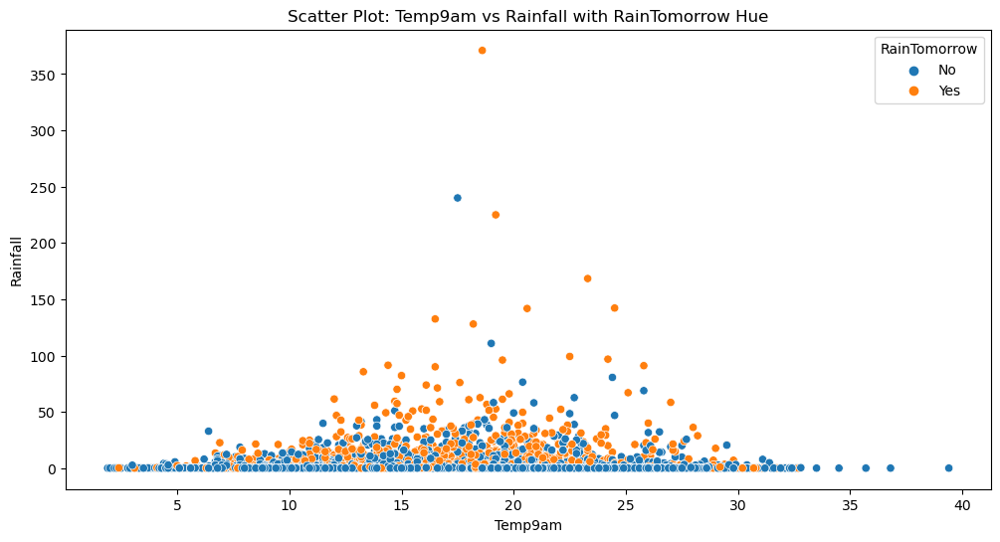

In [38]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Temp9am', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Temp9am vs Rainfall with RainTomorrow Hue')
plt.xlabel('Temp9am')
plt.ylabel('Rainfall')
plt.show()

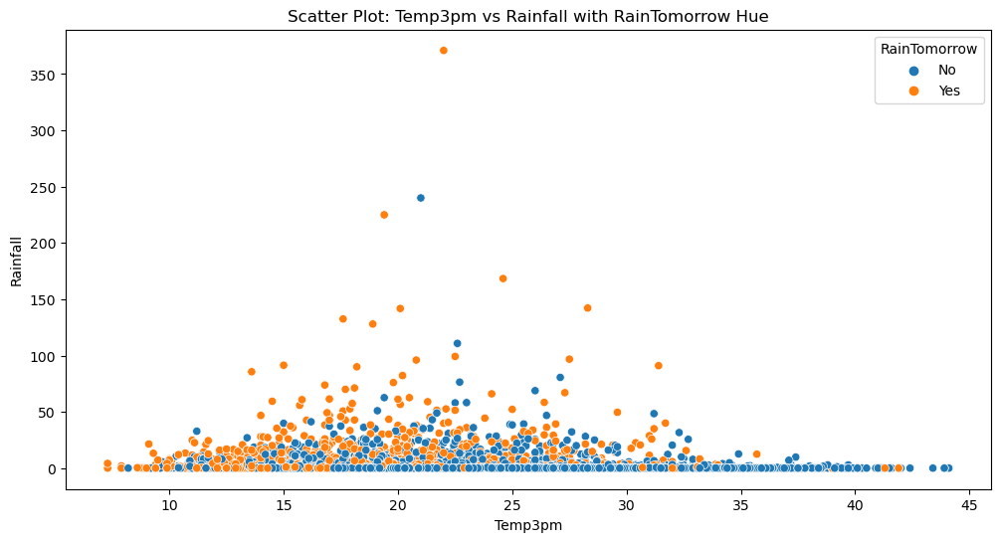

In [39]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Temp3pm', y='Rainfall', hue='RainTomorrow', data=df)
plt.title('Scatter Plot: Temp3pm vs Rainfall with RainTomorrow Hue')
plt.xlabel('Temp3pm')
plt.ylabel('Rainfall')
plt.show()

# MultiVariate Analysis

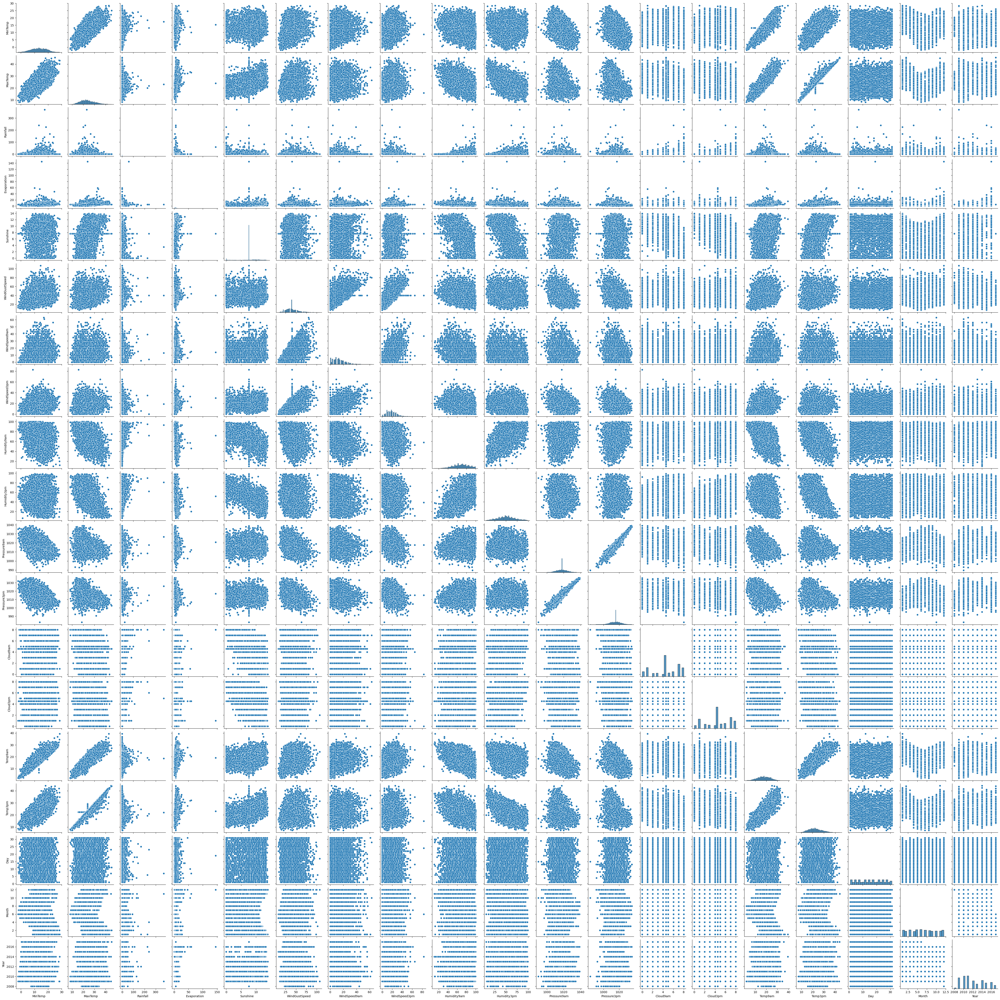

In [40]:
sns.pairplot(df)

# Statistics

In [41]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,15.741958,6.442136,2012.102433
std,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,8.787354,3.437994,2.473137
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,8.000000,3.000000,2010.000000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,16.000000,6.000000,2011.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000


# Check Outliers

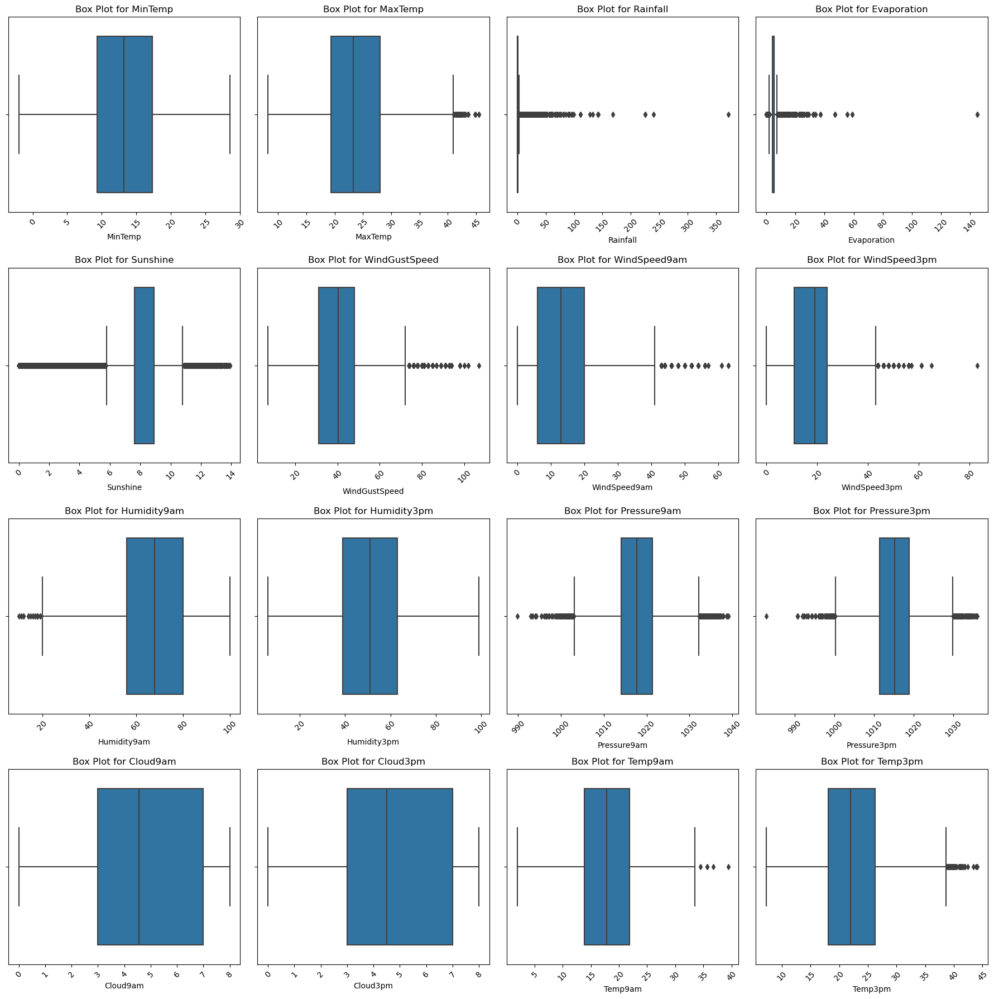

In [42]:
columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
                    'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
                    'Temp9am', 'Temp3pm']

# Create a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(18, 18))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# selected columns and create box plots
for i, column in enumerate(columns):
    sns.boxplot(x=df[column], ax=axes[i])
    axes[i].set_title(f'Box Plot for {column}')
    axes[i].tick_params(axis='x', rotation=45)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

MaxTemp,Rainfall,Evaporation,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm has many outliers.

In [43]:
from scipy.stats import zscore


columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
                    'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
                    'Temp9am', 'Temp3pm']

# Calculate Z-scores for selected columns
z_scores = df[columns].apply(zscore)

#  Z-score threshold for outlier removal
zscore_threshold = 3

# Keep only rows where absolute Z-score is less than the threshold
new_df = df[(z_scores.abs() < zscore_threshold).all(axis=1)]

# Display the shape of the original and filtered DataFrames
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", new_df.shape)


Original DataFrame Shape: (8425, 25)
Filtered DataFrame Shape: (7987, 25)


In [44]:
Data_Loss = ((8425-7987)/8425)*100
Data_Loss

5.198813056379822

# Skewness

In [45]:
new_df.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         3.488446
Evaporation      0.846181
Sunshine        -0.723970
WindGustSpeed    0.506897
WindSpeed9am     0.711395
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
Day              0.002731
Month            0.054460
Year             0.430100
dtype: float64

range +/- 0.5.

Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,Cloud9am,Cloud3pm have skewed values. 

# Remove Skewness


In [46]:
from sklearn.preprocessing import PowerTransformer

In [47]:
from sklearn.preprocessing import PowerTransformer

# Create an instance of the PowerTransformer
power_transformer = PowerTransformer()

# Apply the power transform to the numerical columns
df[numerical_cols] = power_transformer.fit_transform(df[numerical_cols])


In [48]:
new_df.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         3.488446
Evaporation      0.846181
Sunshine        -0.723970
WindGustSpeed    0.506897
WindSpeed9am     0.711395
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
Day              0.002731
Month            0.054460
Year             0.430100
dtype: float64

# Convert Categorical Column to Numerical value

In [49]:
from sklearn.preprocessing import LabelEncoder
categorical_col=['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
LE=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)

In [50]:
# Checking the correlation between features and the target
cor = new_df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.116694,0.063798,0.022192,0.132245,0.048579,-0.037707,0.245658,-0.041030,-0.031195,...,-0.012288,0.041859,0.027050,0.118100,0.060707,0.002934,0.009222,-0.004978,-0.086011,0.481143
MinTemp,0.116694,1.000000,0.718598,0.093118,0.372576,0.065682,-0.154935,0.231097,-0.045231,-0.154184,...,-0.427936,0.089354,0.036649,0.888690,0.687570,0.061728,0.091021,0.010924,-0.247066,0.040001
MaxTemp,0.063798,0.718598,1.000000,-0.138415,0.468786,0.387050,-0.237955,0.136337,-0.217160,-0.190417,...,-0.414358,-0.252579,-0.248268,0.864864,0.974957,-0.219747,-0.149708,0.017068,-0.164351,0.120204
Rainfall,0.022192,0.093118,-0.138415,1.000000,-0.095749,-0.166857,0.084866,0.093945,0.123473,0.075682,...,-0.043905,0.224696,0.188755,-0.033343,-0.146935,0.689452,0.270580,-0.015131,0.001459,0.010239
Evaporation,0.132245,0.372576,0.468786,-0.095749,1.000000,0.369080,-0.121384,0.200769,-0.115309,-0.036752,...,-0.275720,-0.116113,-0.146421,0.439628,0.454352,-0.163847,-0.089365,0.011560,-0.055232,0.124246
Sunshine,0.048579,0.065682,0.387050,-0.166857,0.369080,1.000000,-0.104739,0.009797,-0.076595,-0.069789,...,-0.063832,-0.527350,-0.541996,0.261680,0.403489,-0.219089,-0.317675,0.003451,-0.000727,0.054960
WindGustDir,-0.037707,-0.154935,-0.237955,0.084866,-0.121384,-0.104739,1.000000,0.005465,0.405681,0.507292,...,-0.008263,0.123415,0.093527,-0.185080,-0.249791,0.121709,0.044378,0.017003,0.038044,-0.096042
WindGustSpeed,0.245658,0.231097,0.136337,0.093945,0.200769,0.009797,0.005465,1.000000,-0.069460,0.076737,...,-0.336132,0.013678,0.064375,0.198936,0.101786,0.076677,0.181478,-0.005232,0.045638,-0.035546
WindDir9am,-0.041030,-0.045231,-0.217160,0.123473,-0.115309,-0.076595,0.405681,-0.069460,1.000000,0.243622,...,0.081400,0.092396,0.062637,-0.101576,-0.224390,0.149239,0.027091,-0.010014,0.018344,-0.034468
WindDir3pm,-0.031195,-0.154184,-0.190417,0.075682,-0.036752,-0.069789,0.507292,0.076737,0.243622,1.000000,...,-0.037280,0.073742,0.054321,-0.172000,-0.202000,0.100983,0.003674,-0.000714,0.028629,-0.010781


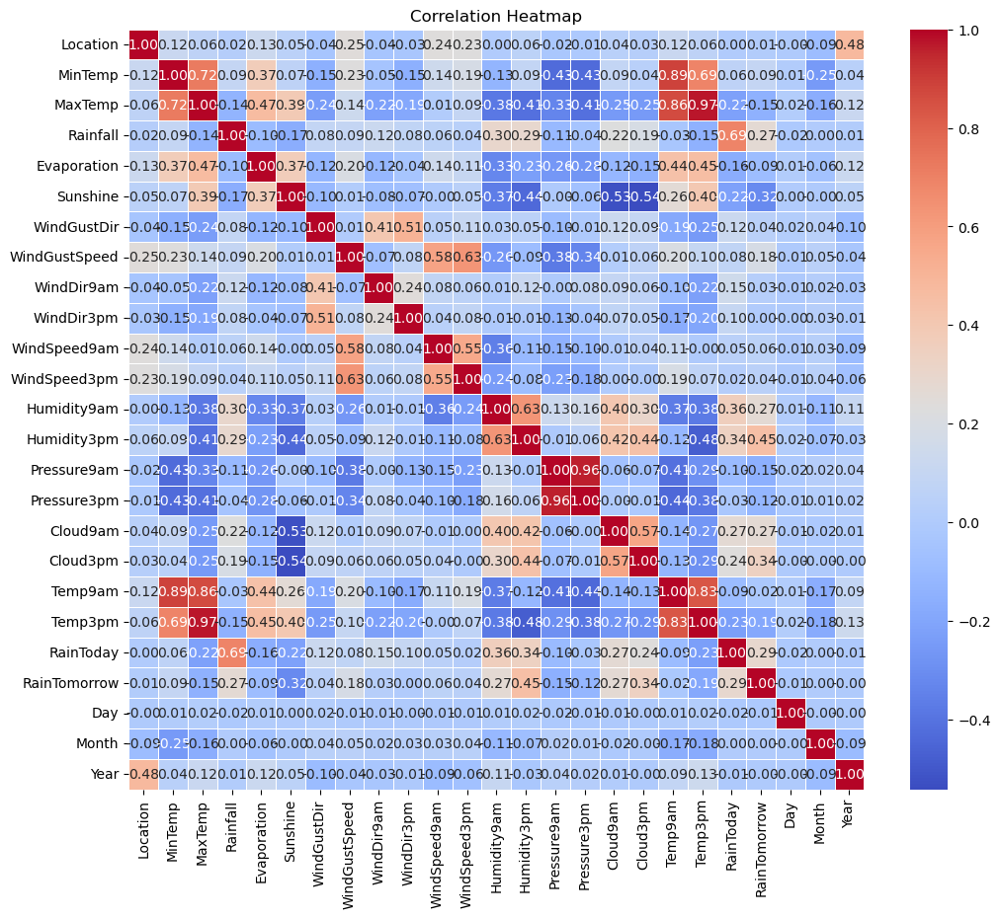

In [51]:
# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(cor, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Predict RainTomorrow

# Separating Features and Target 

In [52]:
x = new_df.drop('RainTomorrow',axis=1)
y= new_df['RainTomorrow']

In [53]:
x.shape,y.shape

((7987, 24), (7987,))

In [54]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-1.508427,0.056444,-0.145732,-0.282088,0.110484,-0.013374,1.229267,0.364103,1.250245,1.400214,...,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.098593,-0.542476,-1.671657,1.634113,-1.661315
1,-1.508427,-1.058476,0.220676,-0.408537,0.110484,-0.013374,1.441960,0.364103,-0.277857,1.626597,...,-1.202435,-1.279988,0.011773,0.013138,-0.084254,0.329747,-0.542476,-1.557976,1.634113,-1.661315
2,-1.508427,-0.036466,0.320605,-0.408537,0.110484,-0.013374,1.654654,0.520531,1.250245,1.626597,...,-1.703856,-1.128109,0.011773,-1.076661,0.597788,0.141277,-0.542476,-1.444296,1.634113,-1.661315
3,-1.508427,-0.724000,0.703668,-0.408537,0.110484,-0.013374,-0.684977,-1.200173,0.377044,-1.769138,...,-0.032451,-0.436219,0.011773,0.013138,0.077282,0.706687,-0.542476,-1.330616,1.634113,-1.661315
4,-1.508427,0.818306,1.419829,-0.197789,0.110484,-0.013374,1.229267,0.129462,-1.369358,-0.184462,...,-1.169007,-1.583744,1.013630,1.535531,0.023437,1.254963,-0.542476,-1.216936,1.634113,-1.661315


# Checking Variance Inflation Factor(VIF)

In [55]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Function to calculate VIF
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data


vif_result = calculate_vif(x)

# Display the VIF results
print(vif_result)


         Variable        VIF
0        Location   1.571687
1         MinTemp   8.796643
2         MaxTemp  26.428053
3        Rainfall   1.955520
4     Evaporation   1.543211
5        Sunshine   1.939243
6     WindGustDir   1.615820
7   WindGustSpeed   2.317971
8      WindDir9am   1.352548
9      WindDir3pm   1.484028
10   WindSpeed9am   2.021890
11   WindSpeed3pm   1.968435
12    Humidity9am   3.974302
13    Humidity3pm   5.384233
14    Pressure9am  19.922151
15    Pressure3pm  19.056498
16       Cloud9am   1.922103
17       Cloud3pm   1.806473
18        Temp9am  17.663001
19        Temp3pm  33.315343
20      RainToday   2.136639
21            Day   1.004285
22          Month   1.153521
23           Year   1.514897


 we will drop  temp3pm as it have highest VIF values

In [56]:
x.drop('Temp3pm',axis=1,inplace=True)

In [57]:
#Again check Vif
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data


vif_result = calculate_vif(x)

# Display the VIF results
print(vif_result)

         Variable        VIF
0        Location   1.571008
1         MinTemp   8.759056
2         MaxTemp   9.626135
3        Rainfall   1.954115
4     Evaporation   1.542669
5        Sunshine   1.939202
6     WindGustDir   1.612584
7   WindGustSpeed   2.305962
8      WindDir9am   1.351476
9      WindDir3pm   1.483026
10   WindSpeed9am   2.021395
11   WindSpeed3pm   1.965400
12    Humidity9am   3.523449
13    Humidity3pm   3.649128
14    Pressure9am  19.347028
15    Pressure3pm  18.562002
16       Cloud9am   1.921028
17       Cloud3pm   1.796047
18        Temp9am  16.305594
19      RainToday   2.134722
20            Day   1.003829
21          Month   1.138594
22           Year   1.514725


now we remove Pressure9am

In [58]:
x.drop('Pressure9am',axis=1,inplace=True)

In [59]:
#Again check Vif
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data


vif_result = calculate_vif(x)

# Display the VIF results
print(vif_result)

         Variable        VIF
0        Location   1.571004
1         MinTemp   8.641273
2         MaxTemp   9.227104
3        Rainfall   1.950905
4     Evaporation   1.525712
5        Sunshine   1.934747
6     WindGustDir   1.598504
7   WindGustSpeed   2.288557
8      WindDir9am   1.330558
9      WindDir3pm   1.412478
10   WindSpeed9am   2.020803
11   WindSpeed3pm   1.954550
12    Humidity9am   3.522278
13    Humidity3pm   3.646612
14    Pressure3pm   1.459489
15       Cloud9am   1.920793
16       Cloud3pm   1.794303
17        Temp9am  16.246991
18      RainToday   2.129151
19            Day   1.003163
20          Month   1.137893
21           Year   1.513357


Now we will remove Temp9am

In [60]:
x.drop('Temp9am',axis=1,inplace=True)

In [61]:
#Again check Vif
def calculate_vif(data_frame):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(data_frame.values, i) for i in range(data_frame.shape[1])]
    return vif_data


vif_result = calculate_vif(x)

# Display the VIF results
print(vif_result)

         Variable       VIF
0        Location  1.568664
1         MinTemp  4.489894
2         MaxTemp  5.498384
3        Rainfall  1.949935
4     Evaporation  1.521444
5        Sunshine  1.927332
6     WindGustDir  1.596856
7   WindGustSpeed  2.253027
8      WindDir9am  1.330555
9      WindDir3pm  1.412091
10   WindSpeed9am  1.993891
11   WindSpeed3pm  1.906861
12    Humidity9am  2.474931
13    Humidity3pm  2.896297
14    Pressure3pm  1.456251
15       Cloud9am  1.899237
16       Cloud3pm  1.790890
17      RainToday  2.127568
18            Day  1.002984
19          Month  1.125024
20           Year  1.489264


now all vif value less tha 10. so proceed further

In [62]:
y.value_counts()



0    6165
1    1822
Name: RainTomorrow, dtype: int64

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

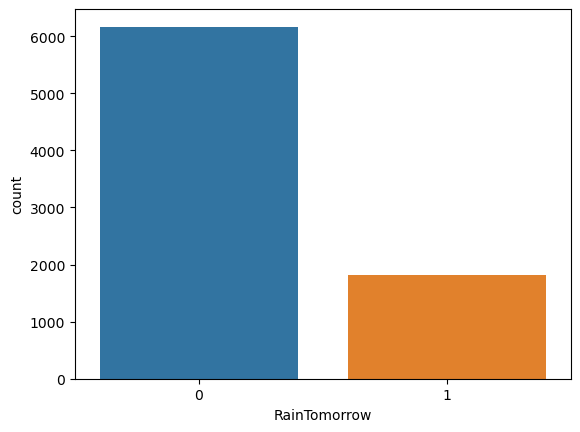

In [63]:
sns.countplot(y)

Here data is imbalance so we use SMOTE

# Oversampling

In [64]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [65]:
# Checking value count of target column
y.value_counts()

0    6165
1    6165
Name: RainTomorrow, dtype: int64

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

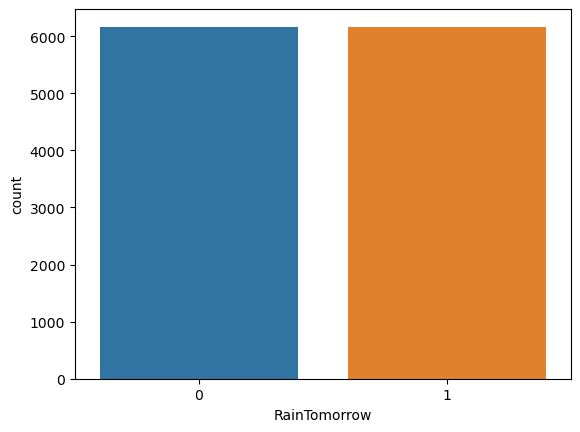

In [66]:
sns.countplot(y)

# Finding best RandomState:

In [67]:
from sklearn.linear_model import LogisticRegression

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    rf = RandomForestClassifier()
    rf.fit(x_train, y_train)
    pred = rf.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9399837793998378  on Random_state  132


# Data Preprocessing

In [68]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.25, random_state=112)

# Model Training

# LogisticRegression

In [69]:
 from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
#Initialize the logistic regression model
logreg_model = LogisticRegression(random_state=112)

# Train the model on the training data
logreg_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = logreg_model.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")

Accuracy: 0.78
Confusion Matrix:
[[1225  300]
 [ 389 1169]]
Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.80      0.78      1525
           1       0.80      0.75      0.77      1558

    accuracy                           0.78      3083
   macro avg       0.78      0.78      0.78      3083
weighted avg       0.78      0.78      0.78      3083



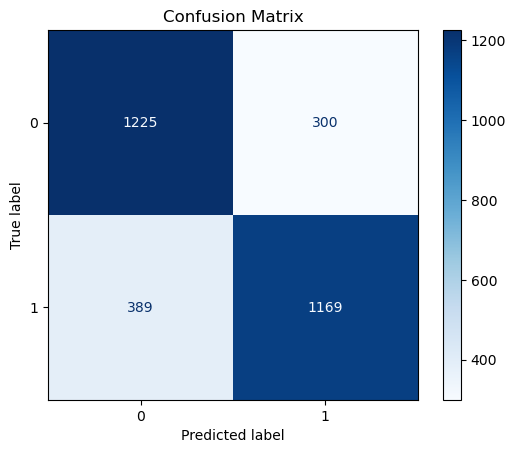

In [70]:
from sklearn.metrics import plot_confusion_matrix
# Plotting the confusion matrix
disp = plot_confusion_matrix(logreg_model, x_test, y_test, cmap=plt.cm.Blues, values_format=".0f")
disp.ax_.set_title('Confusion Matrix')
plt.show()

# SVC

In [71]:
from sklearn.svm import SVC
# Initialize the Support Vector Classifier model
svc_model = SVC(random_state=112)

# Train the model on the training data
svc_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = svc_model.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")

Accuracy: 0.85
Confusion Matrix:
[[1303  222]
 [ 226 1332]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.85      0.85      1525
           1       0.86      0.85      0.86      1558

    accuracy                           0.85      3083
   macro avg       0.85      0.85      0.85      3083
weighted avg       0.85      0.85      0.85      3083



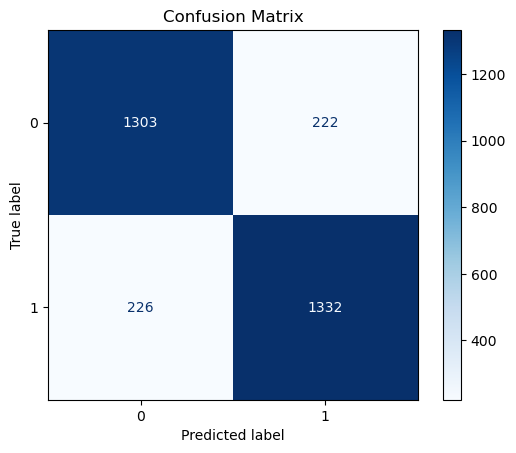

In [72]:
from sklearn.metrics import plot_confusion_matrix
# Plotting the confusion matrix
disp = plot_confusion_matrix(svc_model, x_test, y_test, cmap=plt.cm.Blues, values_format=".0f")
disp.ax_.set_title('Confusion Matrix')
plt.show()

# Random Forest Classifier

In [73]:
# Initialize the Random Forest classifier model
rf_model = RandomForestClassifier(random_state=112)

# Train the model on the training data
rf_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")

Accuracy: 0.94
Confusion Matrix:
[[1443   82]
 [ 105 1453]]
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1525
           1       0.95      0.93      0.94      1558

    accuracy                           0.94      3083
   macro avg       0.94      0.94      0.94      3083
weighted avg       0.94      0.94      0.94      3083



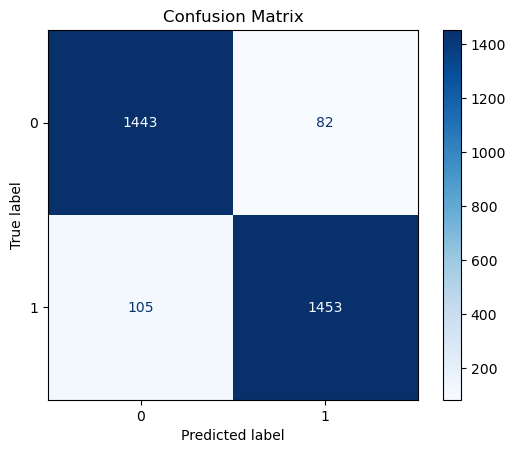

In [74]:
# Plotting the confusion matrix
disp = plot_confusion_matrix(rf_model, x_test, y_test, cmap=plt.cm.Blues, values_format=".0f")
disp.ax_.set_title('Confusion Matrix')
plt.show()

# DecisionTreeClassifier

In [75]:
from sklearn.tree import DecisionTreeClassifier
# Initialize the Decision Tree Classifier model
dt_model = DecisionTreeClassifier(random_state=112)

# Train the model on the training data
dt_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = dt_model.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")

Accuracy: 0.88
Confusion Matrix:
[[1320  205]
 [ 179 1379]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.87      0.87      1525
           1       0.87      0.89      0.88      1558

    accuracy                           0.88      3083
   macro avg       0.88      0.88      0.88      3083
weighted avg       0.88      0.88      0.88      3083



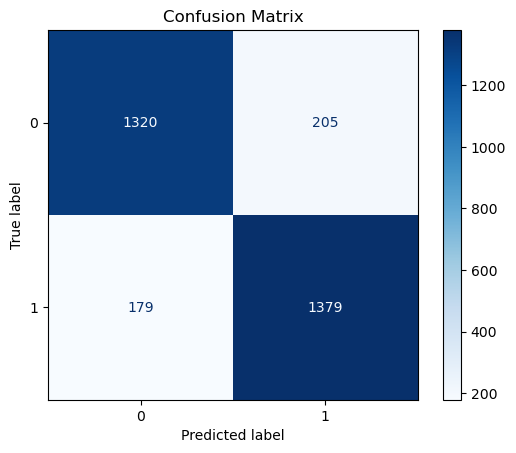

In [76]:
# Plotting the confusion matrix
disp = plot_confusion_matrix(dt_model, x_test, y_test, cmap=plt.cm.Blues, values_format=".0f")
disp.ax_.set_title('Confusion Matrix')
plt.show()

# KNeighborsClassifier

In [77]:
from sklearn.neighbors import KNeighborsClassifier
# Initialize the KNN model
knn_model = KNeighborsClassifier(n_neighbors=5)  

# Train the model on the training data
knn_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred_knn = knn_model.predict(x_test)

# Evaluate the model
accuracy_knn = accuracy_score(y_test, y_pred_knn)
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
classification_rep_knn = classification_report(y_test, y_pred_knn)

# Print the evaluation metrics for KNN

print(f"Accuracy: {accuracy_knn:.2f}")
print(f"Confusion Matrix:\n{conf_matrix_knn}")
print(f"Classification Report:\n{classification_rep_knn}")

Accuracy: 0.87
Confusion Matrix:
[[1195  330]
 [  56 1502]]
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.78      0.86      1525
           1       0.82      0.96      0.89      1558

    accuracy                           0.87      3083
   macro avg       0.89      0.87      0.87      3083
weighted avg       0.89      0.87      0.87      3083



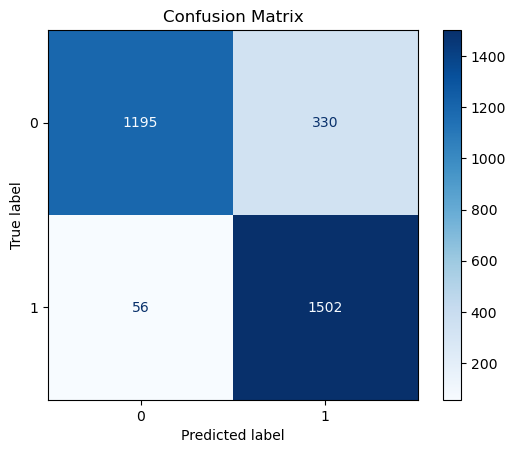

In [78]:
# Plotting the confusion matrix
disp = plot_confusion_matrix(knn_model, x_test, y_test, cmap=plt.cm.Blues, values_format=".0f")
disp.ax_.set_title('Confusion Matrix')
plt.show()

# AdaBoostClassifier

In [79]:
from sklearn.ensemble import AdaBoostClassifier
# Initialize the AdaBoostClassifier with the SVM model as the base estimator
adaboost_model = AdaBoostClassifier()

# Train the AdaBoost model on the training data
adaboost_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = adaboost_model.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")

Accuracy: 0.83
Confusion Matrix:
[[1284  241]
 [ 285 1273]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.84      0.83      1525
           1       0.84      0.82      0.83      1558

    accuracy                           0.83      3083
   macro avg       0.83      0.83      0.83      3083
weighted avg       0.83      0.83      0.83      3083



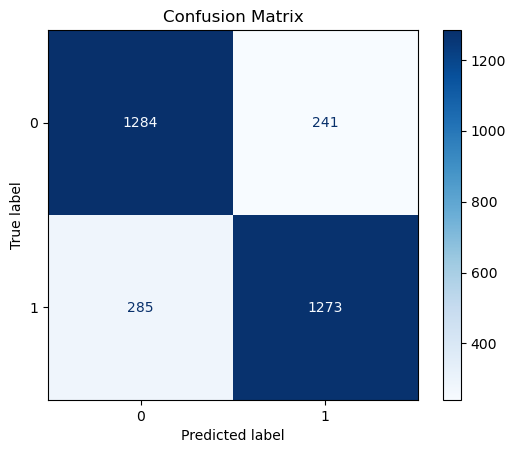

In [80]:
# Plotting the confusion matrix
disp = plot_confusion_matrix(adaboost_model, x_test, y_test, cmap=plt.cm.Blues, values_format=".0f")
disp.ax_.set_title('Confusion Matrix')
plt.show()

# Checking Cross Validation Score


In [81]:
from sklearn.model_selection import cross_val_score, ShuffleSplit

# Create instances of the classifiers
rf_model = RandomForestClassifier(random_state=112)
dt_model = DecisionTreeClassifier(random_state=112)
svc_model = SVC(random_state=112)
adaboost_model = AdaBoostClassifier(random_state=112)
knn_model = KNeighborsClassifier()
logreg_model = LogisticRegression(random_state=112)

# List of models
models = [rf_model, dt_model, svc_model, adaboost_model, knn_model, logreg_model]

# Iterate through models and print cross-validation scores
for model in models:
    cv = ShuffleSplit(n_splits=5, test_size=0.30, random_state=maxRS)
    cvs = cross_val_score(model, x, y, cv=cv)
    print(f"Cross Validation of {type(model).__name__} model: {cvs.mean()}")


Cross Validation of RandomForestClassifier model: 0.928521221951879
Cross Validation of DecisionTreeClassifier model: 0.864882400648824
Cross Validation of SVC model: 0.8503919978372533
Cross Validation of AdaBoostClassifier model: 0.8163287374966206
Cross Validation of KNeighborsClassifier model: 0.8597458772641253
Cross Validation of LogisticRegression model: 0.7743714517437145


In [82]:
# Create a list of model names
model_names = ['Random Forest', 'Decision Tree', 'KNN', 'SVC', 'AdaBoost', 'Logistic Regression']

# Create lists for accuracy and cross-validation score
accuracy_scores = [0.94, 0.88, 0.87, 0.87, 0.82, 0.78]
cross_val_scores = [0.94, 0.87, 0.86, 0.85, 0.82, 0.77]

# Calculate score differences using list comprehension
score_differences = [accuracy - cross_val for accuracy, cross_val in zip(accuracy_scores, cross_val_scores)]

# Create a DataFrame
model_performance_df = pd.DataFrame({
    'Model': model_names,
    'Accuracy': accuracy_scores,
    'Cross-Validation Score': cross_val_scores,
    'Score Difference': score_differences
})

# Display the DataFrame
print(model_performance_df)

                 Model  Accuracy  Cross-Validation Score  Score Difference
0        Random Forest      0.94                    0.94              0.00
1        Decision Tree      0.88                    0.87              0.01
2                  KNN      0.87                    0.86              0.01
3                  SVC      0.87                    0.85              0.02
4             AdaBoost      0.82                    0.82              0.00
5  Logistic Regression      0.78                    0.77              0.01


Here Random Forest is best fit model beacuse of high accuracy and cross  val score

# Hyper parameterTuning

In [83]:
#  hyperparameter grid for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the Random Forest model
rf_model = RandomForestClassifier(random_state=112)

# Initialize GridSearchCV
grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the grid search to the training data
grid_search.fit(x_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_rf_model.predict(x_test)

Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [84]:
# Print the accuracy
print(f"Accuracy of the Best Random Forest Model: {accuracy:.2f}")

Accuracy of the Best Random Forest Model: 0.83


Model perform better before Hyperparameter tuning

# ROC AUC Curve

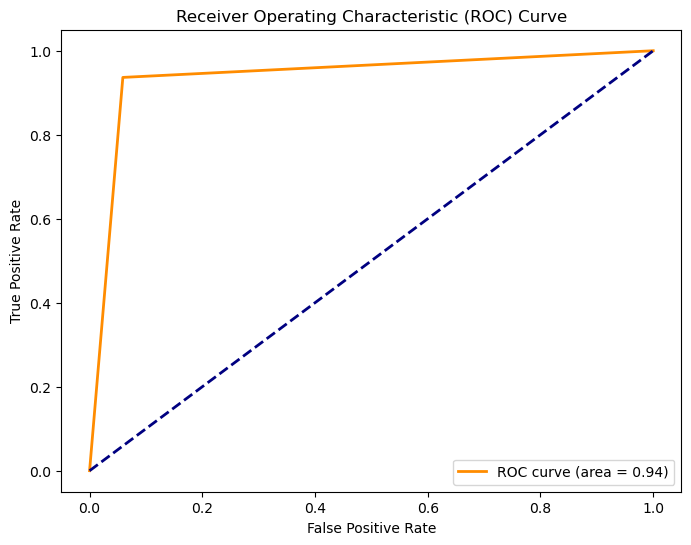

In [85]:
from sklearn.metrics import roc_curve, auc
# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Calculate the area under the ROC curve
roc_auc = auc(fpr, tpr)
# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Area Under Curve is 94% for RandomForest.

In [86]:

# Saving the model using .pkl
import joblib
joblib.dump(rf_model,"RaintomorrowClassification.pkl")

['RaintomorrowClassification.pkl']

In [87]:
rf_model = RandomForestClassifier(random_state=112)

# Train the model on the training data
rf_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(x_test)
a = np.array(y_test)
predicted = np.array(rf_model.predict(x_test))
df_concluded = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
df_concluded

,Original,Predicted
0,0,0
1,1,1
2,1,1
3,0,0
4,1,1
...,...,...
3078,0,0
3079,1,1
3080,1,1
3081,0,0


 So we predicted RainTomorrow with our model, and Model Accuracy is 94%

# predict the Rainfall

In [88]:
x1= new_df.drop("Rainfall", axis=1)
y1= new_df["Rainfall"]

# Feature Scaling using Standard Scalarization

In [93]:
sc = StandardScaler()
sc.fit_transform(x1)

array([[-1.50842735,  0.05644354, -0.14573194, ..., -1.6716567 ,
         1.63411265, -1.66131549],
       [-1.50842735, -1.05847646,  0.22067594, ..., -1.55797642,
         1.63411265, -1.66131549],
       [-1.50842735, -0.03646646,  0.32060536, ..., -1.44429613,
         1.63411265, -1.66131549],
       ...,
       [ 1.02942282, -1.43011646,  0.5204642 , ...,  0.82930956,
        -0.12372583,  2.00413391],
       [ 1.02942282, -0.98414846,  0.5371191 , ...,  0.94298985,
        -0.12372583,  2.00413391],
       [ 1.02942282,  0.33517354,  0.01415115, ...,  1.05667013,
        -0.12372583,  2.00413391]])

# Best Random state

In [96]:
from sklearn.ensemble import RandomForestRegressor
maxscore=0
maxRS=0
for i in range(1,200):
    x1_train,x1_test,y1_train,y1_test = train_test_split(x1,y1,test_size=0.30,random_state=i)
    rfr = RandomForestRegressor()
    rfr.fit(x1_train,y1_train)
    pred = rfr.predict(x1_test)
    score = r2_score(y1_test,pred)
    if score>maxscore:
        maxscore=score
        maxRS=i  
print("Maximum r2 score is ",maxscore,"at Random_state",maxRS)

Maximum r2 score is  0.6805086967629616 at Random_state 137


# Model Training

# KNNeighbors Regressor

In [97]:
 x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.2, random_state=137)


# Initialize the KNN Regressor model
knn_regressor = KNeighborsRegressor(n_neighbors=5)

# Train the model
knn_regressor.fit(x1_train, y1_train)

# Make predictions
y1_pred = knn_regressor.predict(x1_test)

# Evaluate the model
r2 = r2_score(y1_test, y1_pred)
mae = mean_absolute_error(y1_test, y1_pred)
mse = mean_squared_error(y1_test, y1_pred)
rmse = mean_squared_error(y1_test, y1_pred, squared=False)

# Print the evaluation metrics
print(f"R2 Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

R2 Score: 0.5071
MAE: 1.3359
MSE: 10.9176
RMSE: 3.3042


# Random Forest Regressor

In [98]:
# Initialize the Random Forest Regressor model
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=137)  

# Train the model on the training data
rf_regressor.fit(x1_train, y1_train)

# Make predictions on the test set
y1_pred = rf_regressor.predict(x1_test)
# Evaluate the model
r2 = r2_score(y1_test, y1_pred)
mae = mean_absolute_error(y1_test, y1_pred)
mse = mean_squared_error(y1_test, y1_pred)
rmse = mean_squared_error(y1_test, y1_pred, squared=False)

# Print the evaluation metrics
print(f"R2 Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

R2 Score: 0.6883
MAE: 1.0413
MSE: 6.9036
RMSE: 2.6275


# GradientBoosting Regressor

In [102]:
from sklearn.ensemble import GradientBoostingRegressor
#Initialize the Gradient Boosting Regressor model
gb_regressor = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=137)

# Train the model on the training data
gb_regressor.fit(x1_train, y1_train)

# Make predictions on the test set
y1_pred = gb_regressor.predict(x1_test)

# Evaluate the model
r2 = r2_score(y1_test, y1_pred)
mae = mean_absolute_error(y1_test, y1_pred)
mse = mean_squared_error(y1_test, y1_pred)
rmse = mean_squared_error(y1_test, y1_pred, squared=False)

# Print the evaluation metrics
print(f"R2 Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

R2 Score: 0.5657
MAE: 1.3504
MSE: 9.6196
RMSE: 3.1016


# BaggingRegressor

In [101]:
from sklearn.ensemble import BaggingRegressor
# Initialize the Bagging Regressor model
bagging_regressor = BaggingRegressor()

# Train the model on the training data
bagging_regressor.fit(x1_train, y1_train)

# Make predictions on the test set
y1_pred = bagging_regressor.predict(x1_test)

# Evaluate the model
r2 = r2_score(y1_test, y1_pred)
mae = mean_absolute_error(y1_test, y1_pred)
mse = mean_squared_error(y1_test, y1_pred)
rmse = mean_squared_error(y1_test, y1_pred, squared=False)

# Print the evaluation metrics
print(f"R2 Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

R2 Score: 0.6567
MAE: 1.1014
MSE: 7.6053
RMSE: 2.7578


# Decision Tree Regressor

In [103]:
dtr = DecisionTreeRegressor()

dtr.fit(x1_train,y1_train)

y1_pred = dtr.predict(x1_test)
# Evaluate the model
r2 = r2_score(y1_test, y1_pred)
mae = mean_absolute_error(y1_test, y1_pred)
mse = mean_squared_error(y1_test, y1_pred)
rmse = mean_squared_error(y1_test, y1_pred, squared=False)

# Print the evaluation metrics
print(f"R2 Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

R2 Score: 0.3309
MAE: 1.2101
MSE: 14.8207
RMSE: 3.8498


 the Random Forest Regressor is performing reasonably well, with a good balance between explaining variance and minimizing errors.






In [107]:
 rf_model = RandomForestRegressor()

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}



# Initialize GridSearchCV
grid_search = GridSearchCV(rf_model, param_grid, cv=5,  n_jobs=-1)

# Fit the grid search to the training data
grid_search.fit(x1_train, y1_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Make predictions on the test set
y1_pred = best_rf_model.predict(x1_test)

# Evaluate the model
r2 = r2_score(y1_test, y1_pred)
mae = mean_absolute_error(y1_test, y1_pred)
mse = mean_squared_error(y1_test, y1_pred)
rmse = mean_squared_error(y1_test, y1_pred, squared=False)

# Print the evaluation metrics
print(f"R2 Score: {r2:.4f}")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")

Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
R2 Score: 0.6902
MAE: 1.0450
MSE: 6.8632
RMSE: 2.6198


hyperparameters giving accuracy 69%,so will save model with that.

# Saving the Model

In [112]:
# Saving the model using .pkl
import joblib
joblib.dump(best_rf_model,"Rainfallregressor.pkl")

['Rainfallregressor.pkl']

# Conclusion

In [114]:
best_rf_model = RandomForestRegressor()

# Train the model on the training data
best_rf_model.fit(x1_train, y1_train)
# Make predictions on the test set
y_pred = best_rf_model.predict(x1_test)
a = np.array(y1_test)
predicted = np.array(best_rf_model.predict(x1_test))
df_concluded = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
df_concluded

,Original,Predicted
0,0.0,0.104177
1,2.8,6.371000
2,0.0,0.084000
3,0.0,0.042000
4,0.0,0.028000
...,...,...
1593,0.0,0.024000
1594,0.0,0.248000
1595,0.0,0.011000
1596,1.0,0.772059


# Visualization

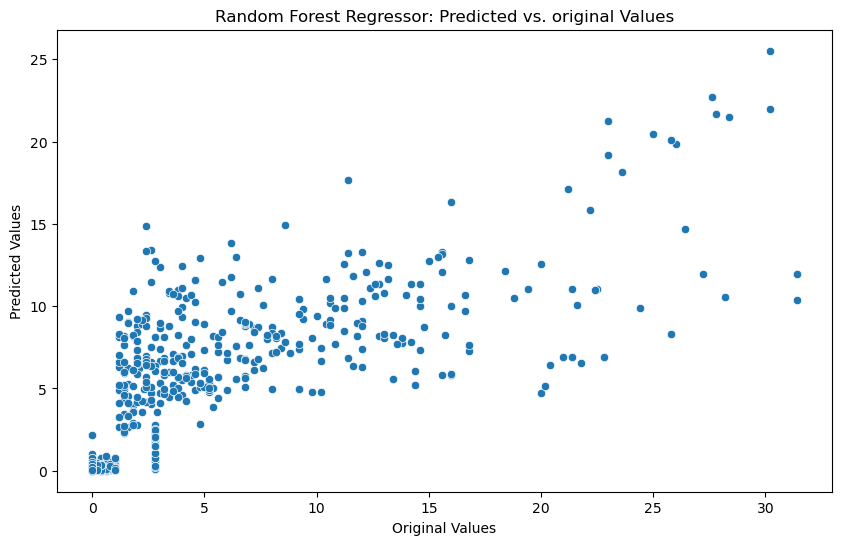

In [116]:
# Scatter plot for predicted vs. actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y1_test, y=y_pred)
plt.title('Random Forest Regressor: Predicted vs. original Values')
plt.xlabel('Original Values')
plt.ylabel('Predicted Values')
plt.show()